In [1]:
import re, string, unicodedata                   #Used for Text PreProcessing
import numpy as np 
import random
import pandas as pd 
import matplotlib.pyplot as plt                       
import seaborn as sns                              
from collections import Counter                
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator 
                   

import nltk                                        
from nltk.corpus import stopwords                         
import warnings                                                           
warnings.filterwarnings("ignore")
from nltk.stem.porter import PorterStemmer  
from sklearn.metrics import recall_score, accuracy_score, precision_score, f1_score, confusion_matrix
from nltk.stem.wordnet import WordNetLemmatizer # Import Lemmatizer.
nltk.download('wordnet')
import contractions
nltk.download('punkt')
nltk.download('vader_lexicon')
nltk.download('stopwords')
from nltk.sentiment.vader import SentimentIntensityAnalyzer

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
# To load the data

tweets=pd.read_csv(r'C:\Users\Admin\Desktop\Trump Twitter Archive -Kaggle.csv')

In [3]:
# To check the first 5 rows in the data

tweets.head()

,id,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date
0,9.845500e+16,Republicans and Democrats have both created ou...,False,False,TweetDeck,49,255,2011-08-02T18:07:48Z,False,02/08/2011
1,1.234650e+18,I was thrilled to be back in the Great city of...,False,False,Twitter for iPhone,73748,17404,2020-03-03T01:34:50Z,False,03/03/2020
2,1.218010e+18,RT @CBS_Herridge: READ: Letter to surveillance...,True,False,Twitter for iPhone,0,7396,2020-01-17T03:22:47Z,False,17/01/2020
3,1.304880e+18,The Unsolicited Mail In Ballot Scam is a major...,False,False,Twitter for iPhone,80527,23502,2020-09-12T20:10:58Z,False,12/09/2020
4,1.220000e+18,RT @MZHemingway: Very friendly telling of even...,True,False,Twitter for iPhone,0,9081,2020-01-17T13:13:59Z,False,17/01/2020


In [4]:
tweets.shape           # Dimension of the dataset

(56571, 10)

In [5]:
tweets.isna().sum()     # Checking for the missing values

id            0
text          0
is_retweet    0
is_deleted    0
device        0
favorites     0
retweets      0
datetime      0
is_flagged    0
date          0
dtype: int64

In [6]:
# Descriptive Statistics

tweets.describe()

,id,favorites,retweets
count,5.657100e+04,5.657100e+04,56571.000000
mean,7.987897e+17,2.834955e+04,8618.987467
std,3.826678e+17,5.781564e+04,13306.132408
min,1.698309e+09,0.000000e+00,0.000000
25%,4.606190e+17,1.000000e+01,59.000000
50%,7.470990e+17,1.640000e+02,3450.000000
75%,1.191705e+18,4.393850e+04,13014.500000
max,1.350000e+18,1.869706e+06,408866.000000


In [7]:
tweets.columns   # columns in the dataset

Index(['id', 'text', 'is_retweet', 'is_deleted', 'device', 'favorites',
       'retweets', 'datetime', 'is_flagged', 'date'],
      dtype='object')

In [8]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

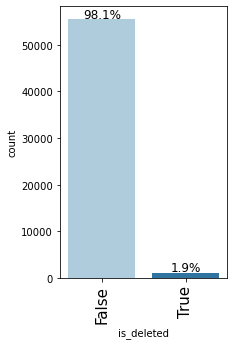

In [9]:
# Barplot of the is_deleted variable

labeled_barplot(data = tweets, feature = "is_deleted", perc = True)

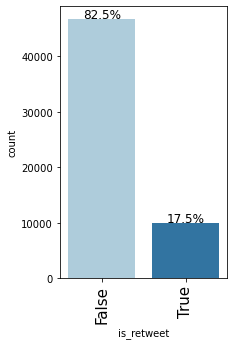

In [10]:
# Barplot of the is_retweet variable

labeled_barplot(data = tweets, feature = "is_retweet", perc = True)

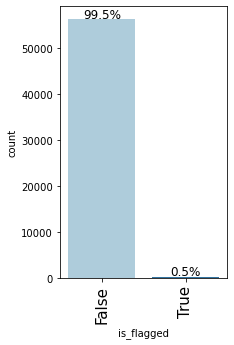

In [11]:
# Barplot of the is_flagged variable

labeled_barplot(data = tweets, feature = "is_flagged", perc = True)

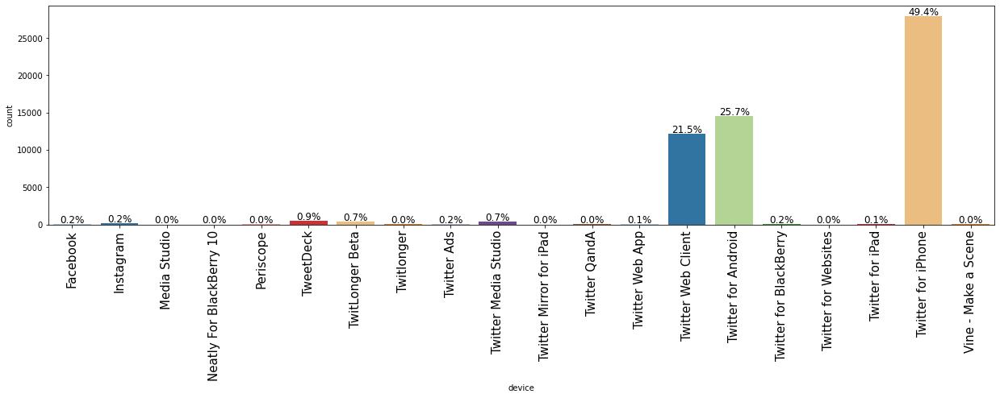

In [12]:
# Barplot of the device variable

labeled_barplot(data = tweets, feature = "device", perc = True)

In [13]:
# To split datetime variable into year, month and hour variables

tweets['year']=pd.to_datetime(tweets["datetime"]).dt.year
tweets['month']=pd.to_datetime(tweets["datetime"]).dt.month
tweets['hour']=pd.to_datetime(tweets["datetime"]).dt.hour    
tweets['day_of_the_week']= pd.to_datetime(tweets["datetime"]).dt.day_name()

# Check the first 5 rows of the dataset again

tweets.head()

,id,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date,year,month,hour,day_of_the_week
0,9.845500e+16,Republicans and Democrats have both created ou...,False,False,TweetDeck,49,255,2011-08-02T18:07:48Z,False,02/08/2011,2011,8,18,Tuesday
1,1.234650e+18,I was thrilled to be back in the Great city of...,False,False,Twitter for iPhone,73748,17404,2020-03-03T01:34:50Z,False,03/03/2020,2020,3,1,Tuesday
2,1.218010e+18,RT @CBS_Herridge: READ: Letter to surveillance...,True,False,Twitter for iPhone,0,7396,2020-01-17T03:22:47Z,False,17/01/2020,2020,1,3,Friday
3,1.304880e+18,The Unsolicited Mail In Ballot Scam is a major...,False,False,Twitter for iPhone,80527,23502,2020-09-12T20:10:58Z,False,12/09/2020,2020,9,20,Saturday
4,1.220000e+18,RT @MZHemingway: Very friendly telling of even...,True,False,Twitter for iPhone,0,9081,2020-01-17T13:13:59Z,False,17/01/2020,2020,1,13,Friday


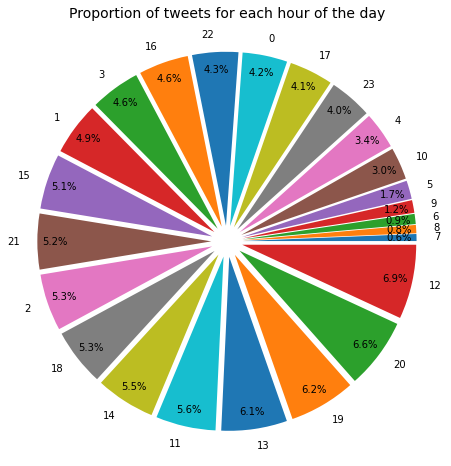

In [14]:
# Pie chart of the hour

Category=tweets['hour'].value_counts().sort_values()
pie, ax = plt.subplots(figsize=[15,8])
# get the index of the hour category 
labels = Category.keys()  
plt.pie(x=Category, autopct="%.1f%%", explode=[0.09]*24, labels=labels, pctdistance=0.9)
plt.title("Proportion of tweets for each hour of the day", fontsize=14);

- He tweeted most at 12
- He tweeted less between 6 and 8 in the morning

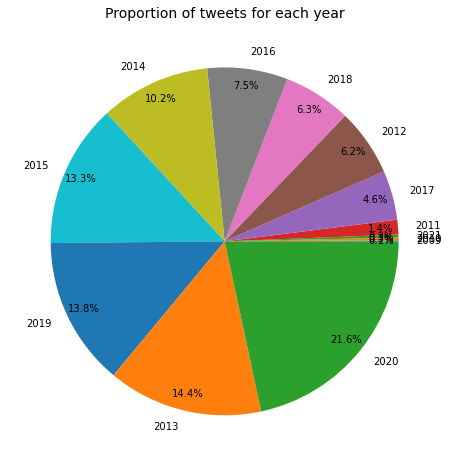

In [15]:
# Pie chart of the year

Category= tweets['year'].value_counts().sort_values()
pie, ax = plt.subplots(figsize=[15,8])
# get the index of the hour category 
labels = Category.keys()  
plt.pie(x=Category, autopct="%.1f%%", labels=labels, pctdistance=0.9)
plt.title("Proportion of tweets for each year", fontsize=14);

- His highest number of tweets in 2020
- Lowest in 2009 and 2021
- 46.6% of his total tweets were tweeted during his presidency period (2017-2021)
- 53.4% of his tweets were tweeted before he became the US president (2009 - 2016)

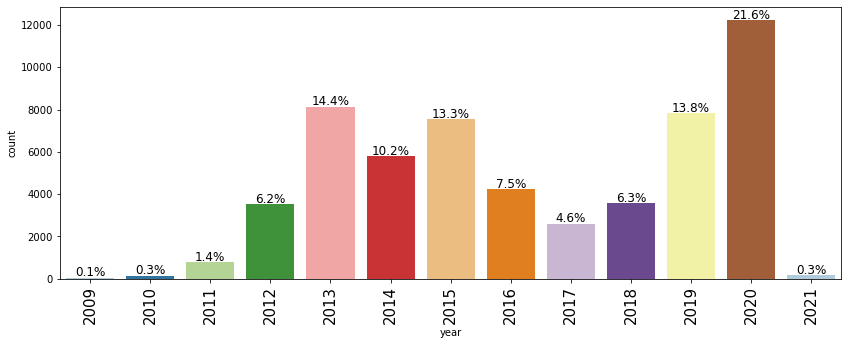

In [16]:
# Barplot of the year variable

labeled_barplot(data = tweets, feature = "year", perc = True)

## Selecting the favorite tweets

In [17]:
 # selecting the favorite tweets

favorites_tweets = tweets[tweets['favorites']!=0]

# To see the first 5 rows in the favorite tweets

favorites_tweets.head()

,id,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date,year,month,hour,day_of_the_week
0,9.845500e+16,Republicans and Democrats have both created ou...,False,False,TweetDeck,49,255,2011-08-02T18:07:48Z,False,02/08/2011,2011,8,18,Tuesday
1,1.234650e+18,I was thrilled to be back in the Great city of...,False,False,Twitter for iPhone,73748,17404,2020-03-03T01:34:50Z,False,03/03/2020,2020,3,1,Tuesday
3,1.304880e+18,The Unsolicited Mail In Ballot Scam is a major...,False,False,Twitter for iPhone,80527,23502,2020-09-12T20:10:58Z,False,12/09/2020,2020,9,20,Saturday
6,1.223640e+18,Getting a little exercise this morning! https:...,False,False,Twitter for iPhone,285863,30209,2020-02-01T16:14:02Z,False,01/02/2020,2020,2,16,Saturday
7,1.319500e+18,https://t.co/4qwCKQOiOw,False,False,Twitter for iPhone,130822,19127,2020-10-23T04:52:14Z,False,23/10/2020,2020,10,4,Friday


In [18]:
favorites_tweets.shape  # dimension of the favorites

(45831, 14)

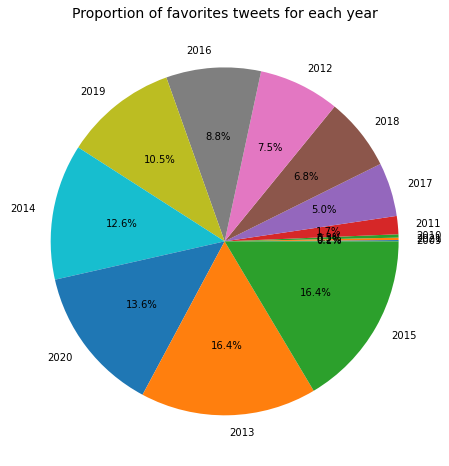

In [19]:
# Pie chart of the favorite tweets

Category=favorites_tweets['year'].value_counts().sort_values()
pie, ax = plt.subplots(figsize=[15,8])
# get the index of the hour category
labels = Category.keys()   
plt.pie(x=Category, autopct="%.1f%%", labels=labels)
plt.title("Proportion of favorites tweets for each year", fontsize=14);

- Though he had the highest number of tweets in 2020, only 13.6% are favorites
- His highest favorite tweets (16.4%) was in 2013 and 2015
- Only 36.1% of his tweets were favorites throughout his presidency period (from 2017 - 2021)
- 63.9% of his tweets before he became the president were favorites

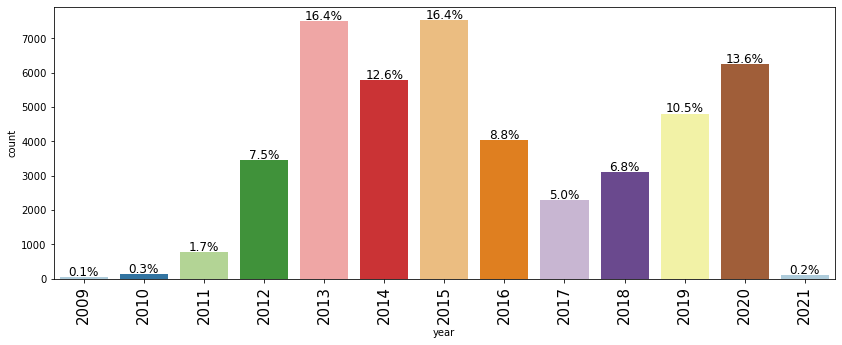

In [20]:
# Barplot of the year variable for favorite tweets

labeled_barplot(data = favorites_tweets, feature = "year", perc = True)

In [21]:
# To see the content of the favorite tweets

for word in favorites_tweets['text']:    
    print(word)

Republicans and Democrats have both created our economic problems.
I was thrilled to be back in the Great city of Charlotte, North Carolina with thousands of hardworking American Patriots who love our Country, cherish our values, respect our laws, and always put AMERICA FIRST! Thank you for a wonderful evening!! #KAG2020 https://t.co/dNJZfRsl9y
The Unsolicited Mail In Ballot Scam is a major threat to our Democracy, & the Democrats know it. Almost all recent elections using this system, even though much smaller &  with far fewer Ballots to count, have ended up being a disaster. Large numbers of missing Ballots & Fraud!
Getting a little exercise this morning! https://t.co/fyAAcbhbgk
https://t.co/4qwCKQOiOw
https://t.co/VlEu8yyovv
https://t.co/z5CRqHO8vg
https://t.co/TQCQiDrVOB
Thank you Elise! https://t.co/Y4Hb0zf5jk
As per your request, Joe... https://t.co/78mzcfLEsF https://t.co/AalVkSfHFi
https://t.co/NmdLNsfDU2
The threshold identification of Ballots is turning out to be even bigger 

**Some of his favorite tweets**

- Republicans and Democrats have both created our economic problems
- I was thrilled to be back in the Great city of Charlotte, North Carolina with thousands of 
hardworking American Patriots who love our Country, cherish our values, respect our laws, and always
put AMERICA FIRST! Thank you for a wonderful evening
- HUGE win today for the United States and for peace in the world. Sudan has agreed to a peace and 
normalization agreement with Israel! With the United Arab Emirates and Bahrain, that’s THREE Arab 
countries to have done so in only a matter of weeks
- Just landed in Ohio. See you in a little while
- Great to be in Ohio, leaving now for Wisconsin. See you in a little while
- We are not acting to thwart the Democratic process, we are acting to protect it
- GDP number just announced. Biggest and Best in the History of our Country, and not even close. 
Next year will be FANTASTIC

## Favorite Tweets Retweeted

In [22]:
# Count of the is_retweet unique values in favorite tweets

favorites_tweets['is_retweet'].value_counts()

False    45806
True        25
Name: is_retweet, dtype: int64

In [23]:
# favorite tweets that were also retweeted

favorite_retweeted = favorites_tweets[favorites_tweets['is_retweet']==True]
favorite_retweeted.head()

,id,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date,year,month,hour,day_of_the_week
13634,1.438140e+17,RT @Newsmax_Media: Trumps Warns of Obama Tippi...,True,False,TweetDeck,10,41,2011-12-05T22:10:19Z,False,05/12/2011,2011,12,22,Monday
14670,2.734910e+17,RT @Newsmax_Media: Donald Trump: Mean-Spirite...,True,False,Twitter Web Client,1,22,2012-11-27T18:19:24Z,False,27/11/2012,2012,11,18,Tuesday
15229,2.612210e+17,RT @APCampaign:Trump to Obama: $5 million dona...,True,False,Twitter Web Client,94,505,2012-10-24T21:41:13Z,False,24/10/2012,2012,10,21,Wednesday
15234,2.612160e+17,RT @ReutersPolitics: Trump to give $5 million ...,True,False,Twitter Web Client,123,560,2012-10-24T21:22:26Z,False,24/10/2012,2012,10,21,Wednesday
15807,2.503340e+17,RT @MittRomney: I am running for president to ...,True,False,Twitter Web Client,68,407,2012-09-24T20:41:55Z,False,24/09/2012,2012,9,20,Monday


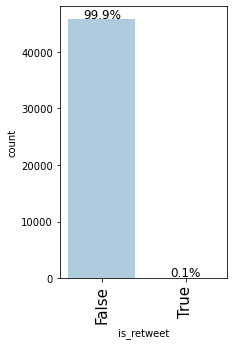

In [24]:
# Barplot of the is_retweet variable in favorite tweets

labeled_barplot(data = favorites_tweets, feature = "is_retweet", perc = True)

- 17.5% of his tweets were re-tweeted but only 0.1% were favorite tweets

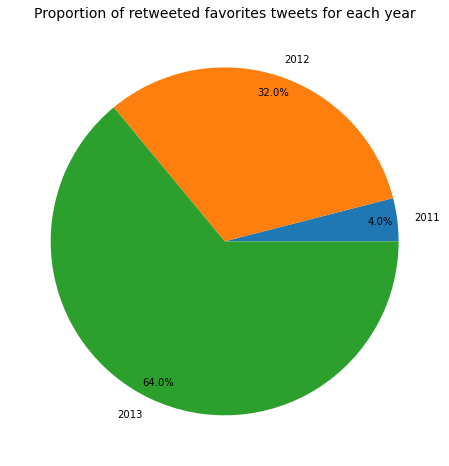

In [25]:
# Visualising the year in the retweeted favorite tweets using pie chart

Category=favorite_retweeted['year'].value_counts().sort_values()
pie, ax = plt.subplots(figsize=[15,8])
# get the index of the hour category
labels = Category.keys()   
plt.pie(x=Category, autopct="%.1f%%", labels=labels, pctdistance=0.9)
plt.title("Proportion of retweeted favorites tweets for each year", fontsize=14);

- All of his retweeted favorite tweets were before he became the president
- His highest retweeted favorite tweets was in 2013 and lowest in 2011

In [26]:
# content of the retweeted favorites

for word in favorite_retweeted['text']:    
    print(word)

RT @Newsmax_Media: Trumps Warns of Obama Tipping Point that May Destroy America  http://t.co/CnHhZArl  via @Newsmax_media
RT @Newsmax_Media:  Donald Trump: Mean-Spirited GOP Won't Win Elections @REALDonaldTrump http://t.co/EZ1fdIT5 via @Newsmax_Media
RT @APCampaign:Trump to Obama: $5 million donation to charity if you release passport and college records http://t.co/Cn8bn9LH #Election2012
RT @ReutersPolitics: Trump to give $5 million to charity if Obama releases records http://t.co/xCQbR1j2
RT @MittRomney: I am running for president to get us creating wealth again--not to redistribute it.
RT @MittRomney: For nearly 4 years, Barack Obama has refused to crack down on China's cheating &amp, American workers have paid the price.
RT @IBDeditorials: Was Barack Obama A Foreign Exchange Student? http://t.co/PnlEqnYc
RT @OCChoppers: Bike we built for @realDonaldTrump. The gold flakes in the paint out in the sunlight looked amazing! http://t.co/Ku6NIvZi
RT @accesshollywood: @realDonald Trump: 'C

**Some of the retweeted favorite tweets**

- Trumps Warns Obama of Tipping Point that May Destroy America 
- I am running for president to get us creating wealth again--not to redistribute it
- Mean-Spirited GOP Won't Win Elections
- For nearly 4 years, Barack Obama has refused to crack down on China's cheating &amp, American 
workers have paid the price.
- GOP is the party of free enterprise.Join us as we innovate
- Trump Int'l Golf Club West Palm Beach is spectacular. Almost makes me wish I had time to 
play/learn/like golf
- Donald Trump coined the phrase 'multilevel focusing'--I love it. It is when two ideas intersect 
&amp, form a new innovation

## Favorite Tweets Deleted

In [27]:
# Count of the is_deleted unique values in favorite tweets

favorites_tweets['is_deleted'].value_counts()

False    45313
True       518
Name: is_deleted, dtype: int64

In [28]:
# select the deleted favorites

favorites_deleted = favorites_tweets[favorites_tweets['is_deleted']==True]
favorites_deleted.head()

,id,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date,year,month,hour,day_of_the_week
199,1.326210e+18,"Nate Simington, a very smart and qualified ind...",False,True,Twitter for iPhone,59,9,2020-11-10T17:12:39Z,False,10/11/2020,2020,11,17,Tuesday
238,1.326330e+18,"“I don’t care what State your in, this compute...",False,True,Twitter for iPhone,19076,5644,2020-11-11T00:50:53Z,False,11/11/2020,2020,11,0,Wednesday
251,1.330000e+18,But how many ballots were fraudulently cast fo...,False,True,Twitter for iPhone,42,14,2020-11-11T00:57:18Z,False,11/11/2020,2020,11,0,Wednesday
573,1.330000e+18,....WILL APPEAL!!!,False,True,Twitter for iPhone,37915,6248,2020-11-22T04:04:32Z,False,22/11/2020,2020,11,4,Sunday
574,1.330000e+18,Thanks Mark. It’s all a continuation of the ne...,False,True,Twitter for iPhone,39385,9458,2020-11-22T04:04:31Z,False,22/11/2020,2020,11,4,Sunday


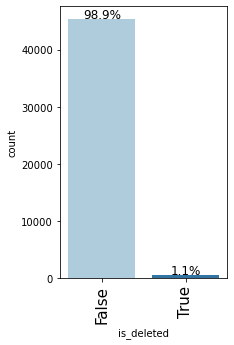

In [29]:
# Barplot of the is_deleted variable in favorite tweets

labeled_barplot(data = favorites_tweets, feature = "is_deleted", perc = True)

- 1.9% of his tweets were deleted but 1.1% of them were favorites

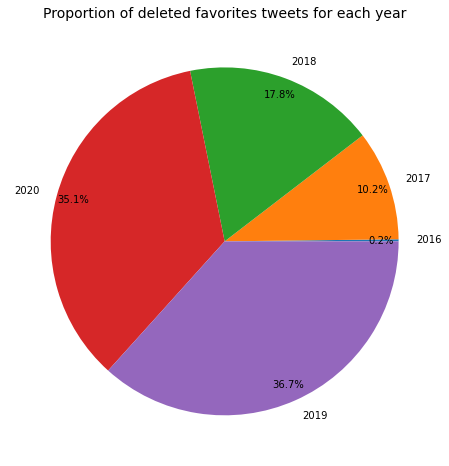

In [30]:
# Visualising the year in deleted favorite tweets using pie chart

Category=favorites_deleted['year'].value_counts().sort_values()
pie, ax = plt.subplots(figsize=[15,8])
# get the index of the hour category 
labels = Category.keys()  
plt.pie(x=Category, autopct="%.1f%%", labels=labels, pctdistance=0.9)
plt.title("Proportion of deleted favorites tweets for each year", fontsize=14);

- 89.6% of his deleted favorite tweets were during his presidency period
- The highest was in 2019
- Only 10.4% deleted he became the president.

In [31]:
# content of the deleted favorites

for word in favorites_deleted['text']:    
    print(word)

Nate Simington, a very smart and qualified individual, is having his Senate hearing today. Republicans will hopefully confirm him to the FCC ASAP! We need action NOW on this very important nomination!! @SenatorWicker @MarshaBlackburn @senatemajldr
“I don’t care what State your in, this computer voting system is wide open to fraud and intervention.” @LouDobbs  True, and wait until you see what’s coming!
But how many ballots were fraudulently cast for the Dems? Did people vote after the election had ended? Did officials actually not allow OBSERVERS and Poll Watchers to look for an honest count? https://t.co/3J198nhQQy
....WILL APPEAL!!!
Thanks Mark. It’s all a continuation of the never ending Witch Hunt. Judge Brann, who would not even allow us to present our case or evidence, is an appointment of Senator Pat “No Tariffs” Toomey of Pennsylvania, no friend of mine, & Obama - No wonder. 900,000 Fraudulent Votes! https://t.co/17rk2KsUPs
Antifa SCUM ran for the hills today when they tried at

**Some of his deleted favorite tweets**

- SLEEPY JOE BIDEN IS PROPOSING THE BIGGEST TAX HIKE IN OUR COUNTRIES HISTORY! 
CAN ANYBODY REALLY VOTE FOR THIS?
- The Fake News refuses to cover the fact that GDP went
- I keep reading Fake News stories that my campaign is running low on money. Not true, & if it were
so, I would put up money myself. The fact is that we have much more money than we had 4 years ago, 
where we spent much less money than Crooked Hillary, and still easily won, 306-223!
- “Trump recognized Russian Meddling MANY TIMES.”

## Favorite Tweets Flagged

In [32]:
# Count of the is_flagged unique values in favorite tweets

favorites_tweets['is_flagged'].value_counts()

False    45606
True       225
Name: is_flagged, dtype: int64

In [33]:
# Selecting the flagged favorites

favorites_flagged = favorites_tweets[favorites_tweets['is_flagged']==True]
favorites_flagged.head()

,id,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date,year,month,hour,day_of_the_week
26,1.330000e+18,Nevada is turning out to be a cesspool of Fake...,False,False,Twitter for iPhone,363489,78378,2020-11-09T19:54:33Z,True,09/11/2020,2020,11,19,Monday
33,1.325900e+18,Pennsylvania prevented us from watching much o...,False,False,Twitter for iPhone,479292,81458,2020-11-09T20:17:47Z,True,09/11/2020,2020,11,20,Monday
78,1.325960e+18,"This is good news, it means I won! \ncc: @RepD...",False,False,Twitter for iPhone,258866,55635,2020-11-10T00:19:24Z,True,10/11/2020,2020,11,0,Tuesday
82,1.330000e+18,...AND I WON THE ELECTION. VOTER FRAUD ALL OVE...,False,False,Twitter for iPhone,246973,54880,2020-11-18T13:31:43Z,True,18/11/2020,2020,11,13,Wednesday
84,1.330000e+18,Dominion is running our Election. Rigged! http...,False,False,Twitter for iPhone,163578,40680,2020-11-16T13:26:19Z,True,16/11/2020,2020,11,13,Monday


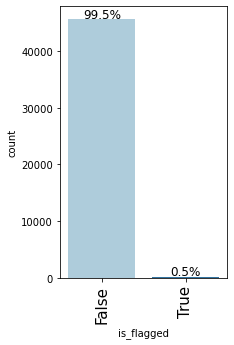

In [34]:
# Barplot of the is_flagged variable

labeled_barplot(data = favorites_tweets, feature = "is_flagged", perc = True)

- All of his flagged tweets were favorites

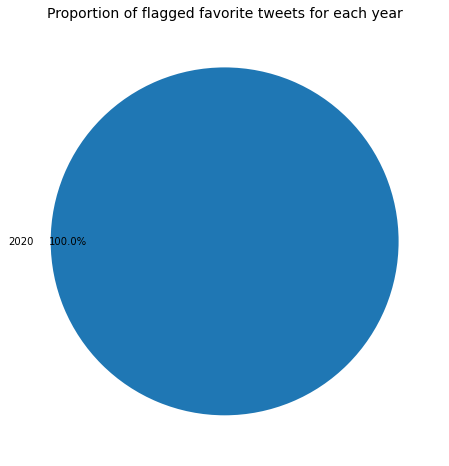

In [35]:
# Visualising the year in flagged favorite tweets using pie chart

Category=favorites_flagged['year'].value_counts().sort_values()
pie, ax = plt.subplots(figsize=[15,8])
# get the index of the hour category 
labels = Category.keys()  
plt.pie(x=Category, autopct="%.1f%%", labels=labels, pctdistance=0.9)
plt.title("Proportion of flagged favorite tweets for each year", fontsize=14);

- All his flagged favorite tweets were in 2020 (during his second electioneering campaign)

In [36]:
# content of the flagged favorites

for word in favorites_flagged['text']:    
    print(word)

Nevada is turning out to be a cesspool of Fake Votes. @mschlapp & @AdamLaxalt are finding things that, when released, will be absolutely shocking!
Pennsylvania prevented us from watching much of the Ballot count. Unthinkable and illegal in this country.
This is good news, it means I won! 
cc: @RepDougCollins @SecretarySonny https://t.co/zO4AlPF8O0
...AND I WON THE ELECTION. VOTER FRAUD ALL OVER THE COUNTRY! https://t.co/9coP3R44UQ
Dominion is running our Election. Rigged! https://t.co/xvwrpLpAZa
The Fake recount going on in Georgia means nothing because they are not allowing signatures to be looked at and verified. Break the unconstitutional Consent Decree!
https://t.co/NXcVFfLcgx
https://t.co/dFGni0viS5
https://t.co/9oAnUZdJLW
This was a rigged election. No Republican Poll Watchers allowed, voting machine “glitches” all over the place (meaning they got caught cheating!), voting after election ended, and so much more! https://t.co/YDh7A7wxLW
Nolte: Top Pollster Finds 47% Say ‘Likely‘ D

**Some of his flagged favorite tweets**

- Nevada is turning out to be a cesspool of Fake Votes
- Pennsylvania prevented us from watching much of the Ballot count. Unthinkable and illegal 
in this country
- This is good news, it means I won!
- This was a rigged election. No Republican Poll Watchers allowed, voting machine “glitches” all over
the place (meaning they got caught cheating!), voting after election ended, and so much more
- Voter Fraud in Detroit is rampant, and has been for many years!
- Almost ZERO ballots rejected in Georgia this election. In years past, close to 4%. Not possible.

## Text Pre-Processing Using NLTK

In [37]:
# To make a copy of the data

Text = tweets['text'].copy()

In [38]:
# To know the total words in the tweets before cleaning

text = []
for t in Text:
    text.append(t)
    
all_text = ', '.join(t for t in text)
#print(all_text)
print(len(all_text))

7336961


In [39]:
# To drop the ID variable

tweets.drop('id', axis=1,inplace=True)

In [40]:
# Removal of the http link using Regular Expression

for i, row in tweets.iterrows():
    clean_text = re.sub(r"http\S+", "", tweets.at[i, 'text'])
    tweets.at[i,'text'] = clean_text
tweets.head()

,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date,year,month,hour,day_of_the_week
0,Republicans and Democrats have both created ou...,False,False,TweetDeck,49,255,2011-08-02T18:07:48Z,False,02/08/2011,2011,8,18,Tuesday
1,I was thrilled to be back in the Great city of...,False,False,Twitter for iPhone,73748,17404,2020-03-03T01:34:50Z,False,03/03/2020,2020,3,1,Tuesday
2,RT @CBS_Herridge: READ: Letter to surveillance...,True,False,Twitter for iPhone,0,7396,2020-01-17T03:22:47Z,False,17/01/2020,2020,1,3,Friday
3,The Unsolicited Mail In Ballot Scam is a major...,False,False,Twitter for iPhone,80527,23502,2020-09-12T20:10:58Z,False,12/09/2020,2020,9,20,Saturday
4,RT @MZHemingway: Very friendly telling of even...,True,False,Twitter for iPhone,0,9081,2020-01-17T13:13:59Z,False,17/01/2020,2020,1,13,Friday


In [41]:
# To define a function to replace the contraction in the tweets

def replace_contractions(text):
    """Replace contractions in string of text"""
    return contractions.fix(text)

# Perform the above operation over all the rows of tweet column of the dataframe.
for i, row in tweets.iterrows():
    text = tweets.at[i, 'text']
    clean_text = replace_contractions(text)
    tweets.at[i,'text'] = clean_text
tweets.head()

,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date,year,month,hour,day_of_the_week
0,Republicans and Democrats have both created ou...,False,False,TweetDeck,49,255,2011-08-02T18:07:48Z,False,02/08/2011,2011,8,18,Tuesday
1,I was thrilled to be back in the Great city of...,False,False,Twitter for iPhone,73748,17404,2020-03-03T01:34:50Z,False,03/03/2020,2020,3,1,Tuesday
2,RT @CBS_Herridge: READ: Letter to surveillance...,True,False,Twitter for iPhone,0,7396,2020-01-17T03:22:47Z,False,17/01/2020,2020,1,3,Friday
3,The Unsolicited Mail In Ballot Scam is a major...,False,False,Twitter for iPhone,80527,23502,2020-09-12T20:10:58Z,False,12/09/2020,2020,9,20,Saturday
4,RT @MZHemingway: Very friendly telling of even...,True,False,Twitter for iPhone,0,9081,2020-01-17T13:13:59Z,False,17/01/2020,2020,1,13,Friday


In [42]:
# Define a function to remove numbers/digits

def remove_numbers(text):
  text = re.sub(r'\d+', '', text)
  return text
# Apply the function

tweets['text'] = tweets['text'].apply(lambda x: remove_numbers(x))
tweets.head()

,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date,year,month,hour,day_of_the_week
0,Republicans and Democrats have both created ou...,False,False,TweetDeck,49,255,2011-08-02T18:07:48Z,False,02/08/2011,2011,8,18,Tuesday
1,I was thrilled to be back in the Great city of...,False,False,Twitter for iPhone,73748,17404,2020-03-03T01:34:50Z,False,03/03/2020,2020,3,1,Tuesday
2,RT @CBS_Herridge: READ: Letter to surveillance...,True,False,Twitter for iPhone,0,7396,2020-01-17T03:22:47Z,False,17/01/2020,2020,1,3,Friday
3,The Unsolicited Mail In Ballot Scam is a major...,False,False,Twitter for iPhone,80527,23502,2020-09-12T20:10:58Z,False,12/09/2020,2020,9,20,Saturday
4,RT @MZHemingway: Very friendly telling of even...,True,False,Twitter for iPhone,0,9081,2020-01-17T13:13:59Z,False,17/01/2020,2020,1,13,Friday


In [43]:
# Tokenization of the tweets

tweets['text'] = tweets.apply(lambda row: nltk.word_tokenize(row['text']), axis=1) 
tweets.head()

,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date,year,month,hour,day_of_the_week
0,"[Republicans, and, Democrats, have, both, crea...",False,False,TweetDeck,49,255,2011-08-02T18:07:48Z,False,02/08/2011,2011,8,18,Tuesday
1,"[I, was, thrilled, to, be, back, in, the, Grea...",False,False,Twitter for iPhone,73748,17404,2020-03-03T01:34:50Z,False,03/03/2020,2020,3,1,Tuesday
2,"[RT, @, CBS_Herridge, :, READ, :, Letter, to, ...",True,False,Twitter for iPhone,0,7396,2020-01-17T03:22:47Z,False,17/01/2020,2020,1,3,Friday
3,"[The, Unsolicited, Mail, In, Ballot, Scam, is,...",False,False,Twitter for iPhone,80527,23502,2020-09-12T20:10:58Z,False,12/09/2020,2020,9,20,Saturday
4,"[RT, @, MZHemingway, :, Very, friendly, tellin...",True,False,Twitter for iPhone,0,9081,2020-01-17T13:13:59Z,False,17/01/2020,2020,1,13,Friday


In [44]:
# Define a function to remove the non-ASCII characters

def remove_non_ascii(words):
    """Remove non-ASCII characters from list of tokenized words"""
    new_words = []                        # Create empty list to store pre-processed words.
    for word in words:
        new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
        new_words.append(new_word)        # Append processed words to new list.
    return new_words

# Apply the function

tweets['text'] = tweets['text'].apply(lambda x: remove_non_ascii(x))
tweets.head()

,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date,year,month,hour,day_of_the_week
0,"[Republicans, and, Democrats, have, both, crea...",False,False,TweetDeck,49,255,2011-08-02T18:07:48Z,False,02/08/2011,2011,8,18,Tuesday
1,"[I, was, thrilled, to, be, back, in, the, Grea...",False,False,Twitter for iPhone,73748,17404,2020-03-03T01:34:50Z,False,03/03/2020,2020,3,1,Tuesday
2,"[RT, @, CBS_Herridge, :, READ, :, Letter, to, ...",True,False,Twitter for iPhone,0,7396,2020-01-17T03:22:47Z,False,17/01/2020,2020,1,3,Friday
3,"[The, Unsolicited, Mail, In, Ballot, Scam, is,...",False,False,Twitter for iPhone,80527,23502,2020-09-12T20:10:58Z,False,12/09/2020,2020,9,20,Saturday
4,"[RT, @, MZHemingway, :, Very, friendly, tellin...",True,False,Twitter for iPhone,0,9081,2020-01-17T13:13:59Z,False,17/01/2020,2020,1,13,Friday


In [45]:
# Define a function to convert tweets to lowercase

def to_lowercase(words):
    """Convert all characters to lowercase from list of tokenized words"""
    new_words = []                        # Create empty list to store pre-processed words.
    for word in words:
        new_word = word.lower()           # Converting to lowercase
        new_words.append(new_word)        # Append processed words to new list.
    return new_words

# Apply the function
tweets['text'] = tweets['text'].apply(lambda x: to_lowercase(x))
tweets.head()

,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date,year,month,hour,day_of_the_week
0,"[republicans, and, democrats, have, both, crea...",False,False,TweetDeck,49,255,2011-08-02T18:07:48Z,False,02/08/2011,2011,8,18,Tuesday
1,"[i, was, thrilled, to, be, back, in, the, grea...",False,False,Twitter for iPhone,73748,17404,2020-03-03T01:34:50Z,False,03/03/2020,2020,3,1,Tuesday
2,"[rt, @, cbs_herridge, :, read, :, letter, to, ...",True,False,Twitter for iPhone,0,7396,2020-01-17T03:22:47Z,False,17/01/2020,2020,1,3,Friday
3,"[the, unsolicited, mail, in, ballot, scam, is,...",False,False,Twitter for iPhone,80527,23502,2020-09-12T20:10:58Z,False,12/09/2020,2020,9,20,Saturday
4,"[rt, @, mzhemingway, :, very, friendly, tellin...",True,False,Twitter for iPhone,0,9081,2020-01-17T13:13:59Z,False,17/01/2020,2020,1,13,Friday


In [46]:
# Define function to remove punctuations

def remove_punctuation(words):
    """Remove punctuation from list of tokenized words"""
    new_words = []                        # Create empty list to store pre-processed words.
    for word in words:
        new_word = re.sub(r'[^\w\s]', '', word)
        if new_word != '':
            new_words.append(new_word)    # Append processed words to new list.
    return new_words

# Apply the function
tweets['text'] = tweets['text'].apply(lambda x: remove_punctuation(x))
tweets.head()

,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date,year,month,hour,day_of_the_week
0,"[republicans, and, democrats, have, both, crea...",False,False,TweetDeck,49,255,2011-08-02T18:07:48Z,False,02/08/2011,2011,8,18,Tuesday
1,"[i, was, thrilled, to, be, back, in, the, grea...",False,False,Twitter for iPhone,73748,17404,2020-03-03T01:34:50Z,False,03/03/2020,2020,3,1,Tuesday
2,"[rt, cbs_herridge, read, letter, to, surveilla...",True,False,Twitter for iPhone,0,7396,2020-01-17T03:22:47Z,False,17/01/2020,2020,1,3,Friday
3,"[the, unsolicited, mail, in, ballot, scam, is,...",False,False,Twitter for iPhone,80527,23502,2020-09-12T20:10:58Z,False,12/09/2020,2020,9,20,Saturday
4,"[rt, mzhemingway, very, friendly, telling, of,...",True,False,Twitter for iPhone,0,9081,2020-01-17T13:13:59Z,False,17/01/2020,2020,1,13,Friday


In [47]:
# instantiate of the corpus
stopwords = stopwords.words('english')

# Define a function to remove stopwords

def remove_stopwords(words):
    """Remove stop words from list of tokenized words"""
    new_words = []                        # Create empty list to store pre-processed words.
    for word in words:
        if word not in stopwords:
            new_words.append(word)        # Append processed words to new list.
    return new_words

# Apply the function
tweets['text'] = tweets['text'].apply(lambda x: remove_stopwords(x))
tweets.head()

,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date,year,month,hour,day_of_the_week
0,"[republicans, democrats, created, economic, pr...",False,False,TweetDeck,49,255,2011-08-02T18:07:48Z,False,02/08/2011,2011,8,18,Tuesday
1,"[thrilled, back, great, city, charlotte, north...",False,False,Twitter for iPhone,73748,17404,2020-03-03T01:34:50Z,False,03/03/2020,2020,3,1,Tuesday
2,"[rt, cbs_herridge, read, letter, surveillance,...",True,False,Twitter for iPhone,0,7396,2020-01-17T03:22:47Z,False,17/01/2020,2020,1,3,Friday
3,"[unsolicited, mail, ballot, scam, major, threa...",False,False,Twitter for iPhone,80527,23502,2020-09-12T20:10:58Z,False,12/09/2020,2020,9,20,Saturday
4,"[rt, mzhemingway, friendly, telling, events, c...",True,False,Twitter for iPhone,0,9081,2020-01-17T13:13:59Z,False,17/01/2020,2020,1,13,Friday


In [48]:
# Instantiate Lemmatization

lemmatizer = WordNetLemmatizer()

# Define a function for lemmatizer

def lemmatize_list(words):
    new_words = []
    for word in words:
      new_words.append(lemmatizer.lemmatize(word))
    return new_words

# Apply the function
tweets['text'] = tweets['text'].apply(lambda x: lemmatize_list(x))
tweets.head()

,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date,year,month,hour,day_of_the_week
0,"[republican, democrat, created, economic, prob...",False,False,TweetDeck,49,255,2011-08-02T18:07:48Z,False,02/08/2011,2011,8,18,Tuesday
1,"[thrilled, back, great, city, charlotte, north...",False,False,Twitter for iPhone,73748,17404,2020-03-03T01:34:50Z,False,03/03/2020,2020,3,1,Tuesday
2,"[rt, cbs_herridge, read, letter, surveillance,...",True,False,Twitter for iPhone,0,7396,2020-01-17T03:22:47Z,False,17/01/2020,2020,1,3,Friday
3,"[unsolicited, mail, ballot, scam, major, threa...",False,False,Twitter for iPhone,80527,23502,2020-09-12T20:10:58Z,False,12/09/2020,2020,9,20,Saturday
4,"[rt, mzhemingway, friendly, telling, event, co...",True,False,Twitter for iPhone,0,9081,2020-01-17T13:13:59Z,False,17/01/2020,2020,1,13,Friday


In [49]:
# Normalize the tweets

def normalize(words):
    words = remove_non_ascii(words)
    words = to_lowercase(words)
    words = remove_punctuation(words)
    words = remove_stopwords(words)
    words = lemmatize_list(words)
    return ' '.join(words)

tweets['text'] = tweets.apply(lambda row: normalize(row['text']), axis=1)
tweets.head()

# Print to see and confirm the cleaned tweets

print(tweets.text)

0             republican democrat created economic problem
1        thrilled back great city charlotte north carol...
2        rt cbs_herridge read letter surveillance court...
3        unsolicited mail ballot scam major threat demo...
4        rt mzhemingway friendly telling event comey ap...
                               ...                        
56566    rt randpaul know joebiden think continue lie w...
56567    rt elisestefanik president realdonaldtrump exc...
56568    rt teamtrump live presidential debate debate t...
56569    signed order support worker delphi corporation...
56570    suburban woman want safety security joe biden ...
Name: text, Length: 56571, dtype: object


In [50]:
# To make a copy of the tweets after cleaning

Text2 = tweets['text'].copy()

In [51]:
# To know the total words in the tweets after cleaning
text = []
for t in Text2:
    text.append(t)
    
all_text2 = ', '.join(t for t in text)
#print(all_text)
print(len(all_text2))

4692274


- Total number of 2644687 words and special charaters were cleaned.

### Most Common Words

In [52]:
# To know the most Common words in content column

tweets['text'] = tweets.apply(lambda row: nltk.word_tokenize(row['text']), axis=1) #Tokenization of data
top = Counter([item for sublist in tweets['text'] for item in sublist])
freq = pd.DataFrame(top.most_common(20))
freq.columns = ['Common_words','count']
freq.style.background_gradient(cmap='Reds')

,Common_words,count
0,realdonaldtrump,11153
1,rt,10164
2,trump,7766
3,great,7657
4,president,4820
5,amp,4415
6,thank,3596
7,people,3557
8,would,2803
9,country,2773


## Sentiment Identification Using Sentiment Intensity Analyzer in VADER LEXICON (NLTK)

In [53]:
# Instantiate SentimentIntensityAnalyzer

sid = SentimentIntensityAnalyzer()
c = 0
text_type = []
for t in text:
    c+=1
    print(c, t)
    ss = sid.polarity_scores(t)
    print(ss)
    
    if(ss['compound'] >= 0.05):
        print('positive')
        #text_type[t] = 'positive'
        text_type.append(1)
    else:
        (ss['compound'] <= -0.05)
        print('negative')
        #text_type[t] = 'negative'
        text_type.append(0)
    print('\n')
    
tweets['sentiment'] = text_type

1 republican democrat created economic problem
{'neg': 0.351, 'neu': 0.39, 'pos': 0.26, 'compound': -0.1779}
negative


2 thrilled back great city charlotte north carolina thousand hardworking american patriot love country cherish value respect law always put america first thank wonderful evening kag
{'neg': 0.0, 'neu': 0.4, 'pos': 0.6, 'compound': 0.9764}
positive


3 rt cbs_herridge read letter surveillance court obtained cbs news question disciplinary action cho
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
negative


4 unsolicited mail ballot scam major threat democracy democrat know almost recent election using system even though much smaller far fewer ballot count ended disaster large number missing ballot fraud
{'neg': 0.414, 'neu': 0.554, 'pos': 0.031, 'compound': -0.9509}
negative


5 rt mzhemingway friendly telling event comey apparent leaking compliant medium read article though
{'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'compound': 0.4939}
positive


6 rt whitehouse p

In [54]:
# Check the first 5 rows in the data

tweets.head()

,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date,year,month,hour,day_of_the_week,sentiment
0,"[republican, democrat, created, economic, prob...",False,False,TweetDeck,49,255,2011-08-02T18:07:48Z,False,02/08/2011,2011,8,18,Tuesday,0
1,"[thrilled, back, great, city, charlotte, north...",False,False,Twitter for iPhone,73748,17404,2020-03-03T01:34:50Z,False,03/03/2020,2020,3,1,Tuesday,1
2,"[rt, cbs_herridge, read, letter, surveillance,...",True,False,Twitter for iPhone,0,7396,2020-01-17T03:22:47Z,False,17/01/2020,2020,1,3,Friday,0
3,"[unsolicited, mail, ballot, scam, major, threa...",False,False,Twitter for iPhone,80527,23502,2020-09-12T20:10:58Z,False,12/09/2020,2020,9,20,Saturday,0
4,"[rt, mzhemingway, friendly, telling, event, co...",True,False,Twitter for iPhone,0,9081,2020-01-17T13:13:59Z,False,17/01/2020,2020,1,13,Friday,1


In [55]:
# Check the count of unique values in the sentiment variable

tweets['sentiment'].value_counts()

1    31261
0    25310
Name: sentiment, dtype: int64

In [56]:
print(f"Positive Sentiment is: {tweets['sentiment'].value_counts()[1]}")
print(f"Negative Sentiment is: {tweets['sentiment'].value_counts()[0]}")

Positive Sentiment is: 31261
Negative Sentiment is: 25310


In [57]:
# Most common words in the positive and negative Sentiments tweets

Positive_sent = tweets[tweets['sentiment']== 1]
Negative_sent = tweets[tweets['sentiment']== 0]

### Finding common words for positive and negative sentiment tweets

In [58]:
#MosT common positive words

top = Counter([item for sublist in Positive_sent['text'] for item in sublist])
freq_positive = pd.DataFrame(top.most_common(20))
freq_positive.columns = ['Common_words','count']
freq_positive.style.background_gradient(cmap='Greens')

,Common_words,count
0,great,7272
1,realdonaldtrump,7082
2,trump,4555
3,rt,4391
4,thank,3448
5,president,2684
6,amp,2456
7,thanks,2310
8,people,2029
9,america,1871


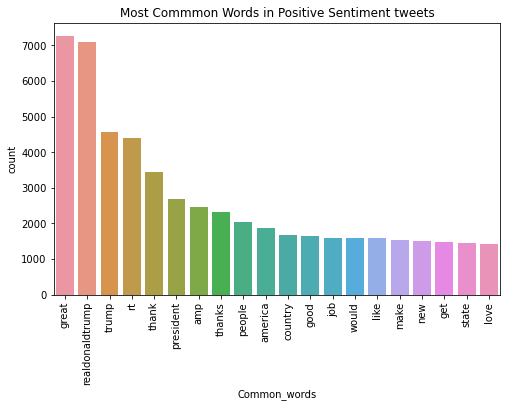

In [59]:
# Barplot of the common words in the negative sentiment tweets

fig, ax = plt.subplots(figsize=(8, 5))
sns.barplot(x='Common_words', y='count', 
            data=freq_positive, ax=ax)
plt.title("Most Commmon Words in Positive Sentiment tweets")
plt.xticks(rotation='vertical');

In [60]:
#MosT common negative words

top = Counter([item for sublist in Negative_sent['text'] for item in sublist])
freq_negative = pd.DataFrame(top.most_common(20))
freq_negative.columns = ['Common_words','count']
freq_negative.style.background_gradient(cmap='flare')

,Common_words,count
0,rt,5773
1,realdonaldtrump,4071
2,trump,3211
3,president,2136
4,amp,1959
5,people,1528
6,democrat,1442
7,obama,1226
8,would,1216
9,get,1165


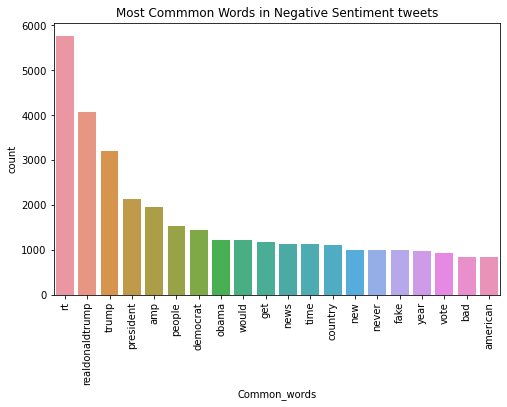

In [61]:
# Barplot of the common words in the posittive sentiment tweets

fig, ax = plt.subplots(figsize=(8, 5))
sns.barplot(x='Common_words', y='count', 
            data=freq_negative, ax=ax)
plt.title("Most Commmon Words in Negative Sentiment tweets")
plt.xticks(rotation='vertical'); 

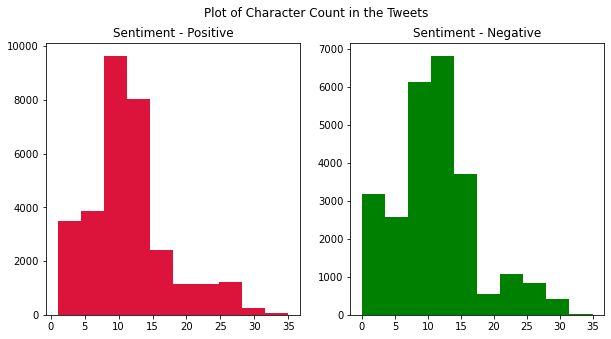

In [62]:
# Plot of character count in Both positive and negative sentiment tweets

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))

pos_tweets_len = tweets[tweets['sentiment']== 1]['text'].str.len()
ax1.hist(pos_tweets_len, color = 'crimson');
ax1.set_title('Sentiment - Positive')

neg_tweets_len = tweets[tweets['sentiment']==0]['text'].str.len()
ax2.hist(neg_tweets_len, color='green');
ax2.set_title('Sentiment - Negative')
fig.suptitle('Plot of Character Count in the Tweets');

In [63]:
# Convert tweets from list to string

tweets['text'] = tweets.apply(lambda row: normalize(row['text']), axis=1)

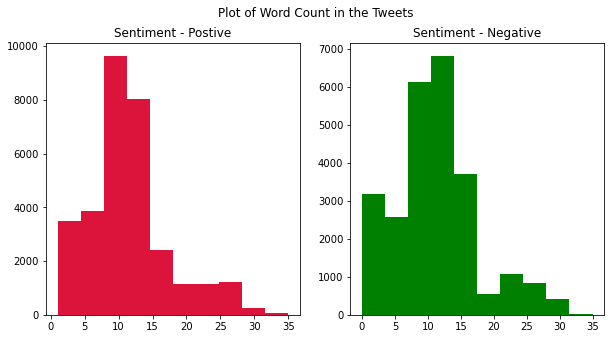

In [64]:
# Plot of word count in Both positive and negative sentiment tweets

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))

pos_tweets_word = tweets.query("sentiment == 1")['text'].str.split().map(lambda x: len(x))
ax1.hist(pos_tweets_word, color = 'crimson');
ax1.set_title('Sentiment - Postive')

neg_tweets_word = tweets.query("sentiment == 0")['text'].str.split().map(lambda x: len(x))
ax2.hist(neg_tweets_word, color='green');
ax2.set_title('Sentiment - Negative');
fig.suptitle('Plot of Word Count in the Tweets');

### Worldcloud

In [65]:
import wordcloud
def show_wordcloud(Positive_sent, title):
    text = ' '.join(Positive_sent['text'].astype(str).tolist())
    stopwords = set(wordcloud.STOPWORDS)
    
    fig_wordcloud = wordcloud.WordCloud(stopwords=stopwords,background_color='white',
                    colormap='viridis', width=800, height=600).generate(text)
    
    plt.figure(figsize=(10,7), frameon=True)
    plt.imshow(fig_wordcloud)  
    plt.axis('off')
    plt.title(title, fontsize=30)
    plt.show()

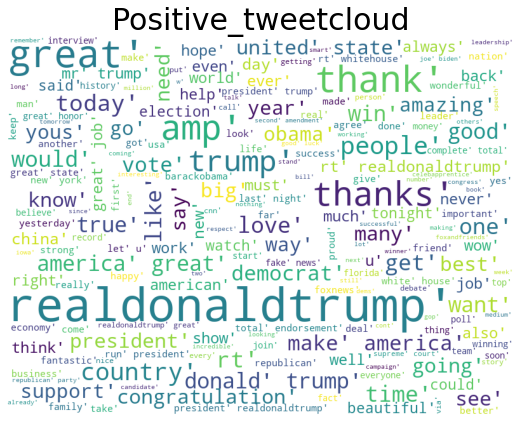

In [66]:
# Positive Sentiment Tweets

show_wordcloud(Positive_sent, "Positive_tweetcloud")

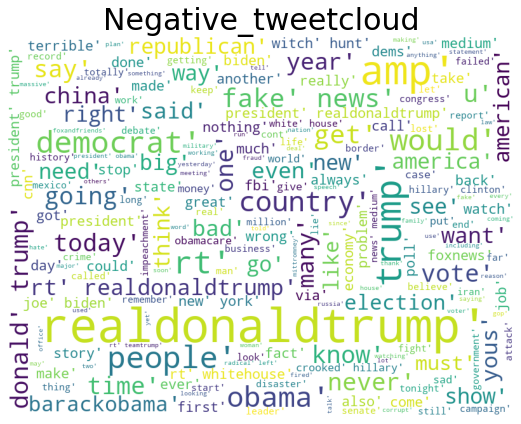

In [67]:
# Negative tive Sentiment Tweets

show_wordcloud(Negative_sent, "Negative_tweetcloud")

### Vectorization And The Model Building

- Vectorization is the process of converting an input text into a numeric form that a machine learning algorithm can use to build a model

In [68]:
# To see the 5 first rows of the dataset

tweets.head()

,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date,year,month,hour,day_of_the_week,sentiment
0,republican democrat created economic problem,False,False,TweetDeck,49,255,2011-08-02T18:07:48Z,False,02/08/2011,2011,8,18,Tuesday,0
1,thrilled back great city charlotte north carol...,False,False,Twitter for iPhone,73748,17404,2020-03-03T01:34:50Z,False,03/03/2020,2020,3,1,Tuesday,1
2,rt cbs_herridge read letter surveillance court...,True,False,Twitter for iPhone,0,7396,2020-01-17T03:22:47Z,False,17/01/2020,2020,1,3,Friday,0
3,unsolicited mail ballot scam major threat demo...,False,False,Twitter for iPhone,80527,23502,2020-09-12T20:10:58Z,False,12/09/2020,2020,9,20,Saturday,0
4,rt mzhemingway friendly telling event comey ap...,True,False,Twitter for iPhone,0,9081,2020-01-17T13:13:59Z,False,17/01/2020,2020,1,13,Friday,1


In [69]:
# Import from the library

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

In [70]:
# Create an instant of the count vectorizer

count_vec = CountVectorizer(max_features=3000)

In [71]:
# Tranform text to vector form

count_features= count_vec.fit_transform(tweets['text']) 

In [72]:
count_features.toarray()  # convert to array

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [73]:
# Select the features and the target

X = count_features.toarray() 
y = tweets['sentiment']

In [74]:
# split the data

x_train, x_test, y_train, y_test  = train_test_split(X, y, test_size=0.2, stratify=y, random_state=0)

print(x_train.shape, x_test.shape, y_train.shape, y_test.shape)

(45256, 3000) (11315, 3000) (45256,) (11315,)


In [75]:
# Create an instant of the classifier

rf = RandomForestClassifier(n_estimators=20, n_jobs=-1,random_state=0)

In [76]:
# To build the RF model

rf.fit(x_train, y_train)               

RandomForestClassifier(n_estimators=20, n_jobs=-1, random_state=0)

In [77]:
#Random forest classifier

# To make prediction

preds = rf.predict(x_test)

# To compute accuracy 
acc = rf.score(x_test,y_test)
print('Accuracy:', acc)

# To compute the precision score
prec = precision_score(y_test,preds)
print('Precision:', prec)

# To compute the recall score
recall = recall_score(y_test,preds)
print('Recall:', recall)

# To compute the F1 score
f1 = f1_score(y_test,preds)
print('F-1 measure: ', f1)

# Confusion matrix
print('\nConfusion Matrix:\n')
print(confusion_matrix(y_test, preds)) 
print(classification_report(y_test, preds))
#print(prediction)

Accuracy: 0.8871409633230225
Precision: 0.883595436324391
Recall: 0.9165200703662242
F-1 measure:  0.8997566527984927

Confusion Matrix:

[[4307  755]
 [ 522 5731]]
              precision    recall  f1-score   support

           0       0.89      0.85      0.87      5062
           1       0.88      0.92      0.90      6253

    accuracy                           0.89     11315
   macro avg       0.89      0.88      0.89     11315
weighted avg       0.89      0.89      0.89     11315



### Using Logistic Regression

In [78]:
#Create an instant of the scaler
sc = StandardScaler()

# use it to transform the text to mean of 0 and standard deviation of 1

x_train_sc = sc.fit_transform(x_train)
x_test_sc = sc.transform(x_test)

In [79]:
# Create an instant of the logistic regression

lr = LogisticRegression(random_state=0)

In [80]:
# To build the model

lr.fit(x_train_sc, y_train)

LogisticRegression(random_state=0)

In [81]:
#Logistic regression model

# to make prediction
preds = lr.predict(x_test_sc)

# accuracy score

acc = lr.score(x_test_sc,y_test)
print('Accuracy:', acc)


# precision score
prec = precision_score(y_test,preds)
print('Precision:', prec)


# To compute the recall score
recall = recall_score(y_test,preds)
print('Recall:', recall)


# To compute F1 score
f1 = f1_score(y_test,preds)
print('F-1 measure: ', f1)
print('\nConfusion Matrix:\n')
print(confusion_matrix(y_test, preds)) 
print(classification_report(y_test, preds))
#print(prediction)

Accuracy: 0.921608484312859
Precision: 0.9375407697325505
Recall: 0.9193986886294578
F-1 measure:  0.9283811061768267

Confusion Matrix:

[[4679  383]
 [ 504 5749]]
              precision    recall  f1-score   support

           0       0.90      0.92      0.91      5062
           1       0.94      0.92      0.93      6253

    accuracy                           0.92     11315
   macro avg       0.92      0.92      0.92     11315
weighted avg       0.92      0.92      0.92     11315



## Building model using Favourite tweets

In [82]:
# selecting the favorite tweets

favorites_tweets = tweets[tweets['favorites']!=0]

In [83]:
# checking the first 5 rows in the favorite tweets

favorites_tweets.head()

,text,is_retweet,is_deleted,device,favorites,retweets,datetime,is_flagged,date,year,month,hour,day_of_the_week,sentiment
0,republican democrat created economic problem,False,False,TweetDeck,49,255,2011-08-02T18:07:48Z,False,02/08/2011,2011,8,18,Tuesday,0
1,thrilled back great city charlotte north carol...,False,False,Twitter for iPhone,73748,17404,2020-03-03T01:34:50Z,False,03/03/2020,2020,3,1,Tuesday,1
3,unsolicited mail ballot scam major threat demo...,False,False,Twitter for iPhone,80527,23502,2020-09-12T20:10:58Z,False,12/09/2020,2020,9,20,Saturday,0
6,getting little exercise morning,False,False,Twitter for iPhone,285863,30209,2020-02-01T16:14:02Z,False,01/02/2020,2020,2,16,Saturday,0
7,,False,False,Twitter for iPhone,130822,19127,2020-10-23T04:52:14Z,False,23/10/2020,2020,10,4,Friday,0


In [84]:
# Create an instant

count_vec2 = CountVectorizer(max_features=3000) 

In [85]:
 # Transform to vector form

count2_features = count_vec2.fit_transform(favorites_tweets['text'])

In [86]:
# convert to array

count2_features.toarray()   

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [87]:
# To split the target and the features into training and test data

x_train2, x_test2, y_train2, y_test2 = train_test_split(count2_features.toarray(),
                                    favorites_tweets['sentiment'], test_size= 0.2, random_state = 0)

print(x_train2.shape, x_test2.shape, y_train2.shape, y_test2.shape)

(36664, 3000) (9167, 3000) (36664,) (9167,)


In [88]:
# Create an instant of the RF model

rf2 = RandomForestClassifier(n_estimators=20, n_jobs=-1,random_state=0)

rf2.fit(x_train2, y_train2)  # To build the model

RandomForestClassifier(n_estimators=20, n_jobs=-1, random_state=0)

In [89]:
#Random forest classifier

# To make prediction

pred = rf2.predict(x_test2)

# To compute accuracy 
acc = rf2.score(x_test2,y_test2)
print('Accuracy:', acc)

# To compute the precision score
prec = precision_score(y_test2,pred)
print('Precision:', prec)

# To compute the recall score
recall = recall_score(y_test2,pred)
print('Recall:', recall)

# To compute the F1 score
f1 = f1_score(y_test2,pred)
print('F-1 measure: ', f1)

# Confusion matrix
print('\nConfusion Matrix:\n')
print(confusion_matrix(y_test2, pred)) 
print(classification_report(y_test2, pred))
#print(prediction)

Accuracy: 0.8908039707646994
Precision: 0.9013592946362968
Recall: 0.9136101284676968
F-1 measure:  0.9074433656957928

Confusion Matrix:

[[3259  537]
 [ 464 4907]]
              precision    recall  f1-score   support

           0       0.88      0.86      0.87      3796
           1       0.90      0.91      0.91      5371

    accuracy                           0.89      9167
   macro avg       0.89      0.89      0.89      9167
weighted avg       0.89      0.89      0.89      9167



### Using Logistic Regression

In [90]:
# Create an instant of the scaler 

sc2 =StandardScaler()

# use it to scale the text to a median of 0, standard deviation of 1

x_train2_sc = sc2.fit_transform(x_train2)
x_test2_sc = sc2.transform(x_test2)

In [91]:
# Create an instant of the model

lr2 = LogisticRegression(random_state=0)  

In [92]:
lr2.fit(x_train2_sc, y_train2)   # Build the logistic regression model

LogisticRegression(random_state=0)

In [93]:
#Logistic regression model

# to make prediction
preds3 = lr2.predict(x_test2_sc)

# accuracy score

acc = lr2.score(x_test2_sc, y_test2)
print('Accuracy:', acc)


# precision score
prec = precision_score(y_test2,preds3)
print('Precision:', prec)


# To compute the recall score
recall = recall_score(y_test2,preds3)
print('Recall:', recall)


# To compute F1 score
f1 = f1_score(y_test2,preds3)
print('F-1 measure: ', f1)
print('\nConfusion Matrix:\n')
print(confusion_matrix(y_test2, preds3)) 
print(classification_report(y_test2, preds3))
#print(prediction)

Accuracy: 0.9166575760881422
Precision: 0.9386783469815273
Recall: 0.917706199962763
F-1 measure:  0.9280738090755037

Confusion Matrix:

[[3474  322]
 [ 442 4929]]
              precision    recall  f1-score   support

           0       0.89      0.92      0.90      3796
           1       0.94      0.92      0.93      5371

    accuracy                           0.92      9167
   macro avg       0.91      0.92      0.91      9167
weighted avg       0.92      0.92      0.92      9167



## Insights from his favorite tweets

- 63.9% of his tweets were favorites before he became the president as againts 36.1% throughout his
presidecy period. 
- There was a decrease in his favorite tweets during his presidency
- All of his retweeted favorite tweets were before he became the president
- 89.6% of his deleted favorite tweets were during his president
- 100% of his flagged favorite tweets were during his presidency

## Conclusions

- Most of his tweets before he became the president were issues-based, which was why many of these
tweets were favorites and retweeted
- Though his popularity grew, his favorite and retweeted favorite tweets did not but decreased
- After his election as the US president, his tweeting (political ideology) changed from issues-based to tweeting about some specific candiates who did not share his opinions and visions, resulting to the flagging of some of his favorite tweets in 2020 and the suspension of his twitter handle @realdonaldtrump inJanuary 2021 when he lost the his second-term re-election bid.